# Exploratory Data Analysis for Bike Sharing Rentals 

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import seaborn as sns
import cufflinks as cf
import plotly.graph_objs as go
import missingno as msno
import plotly.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from datetime import datetime as dt
import calendar as cal

init_notebook_mode(connected=True)
cf.go_offline()

from IPython.core.display import HTML
%matplotlib inline

### Importing Training and Testing Datasets from S3 bucket

In [2]:
df = pd.read_csv('https://s3.us-east-2.amazonaws.com/final-project-dataset/train.csv', low_memory=False)
df_test = pd.read_csv('https://s3.us-east-2.amazonaws.com/final-project-dataset/test.csv', low_memory=False)

### Combining the two datasets for data analysis of independent variables

In [3]:
df_combined = df.append(df_test,sort=True)

In [4]:
df_combined.count()

atemp         17379
casual        10886
count         10886
datetime      17379
holiday       17379
humidity      17379
registered    10886
season        17379
temp          17379
weather       17379
windspeed     17379
workingday    17379
dtype: int64

### Exploring the Training Dataset

In [5]:
df.describe()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [6]:
df.head(4).transpose()

,0,1,2,3
datetime,2011-01-01 00:00:00,2011-01-01 01:00:00,2011-01-01 02:00:00,2011-01-01 03:00:00
season,1,1,1,1
holiday,0,0,0,0
workingday,0,0,0,0
weather,1,1,1,1
temp,9.84,9.02,9.02,9.84
atemp,14.395,13.635,13.635,14.395
humidity,81,80,80,75
windspeed,0,0,0,0
casual,3,8,5,3


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
datetime      10886 non-null object
season        10886 non-null int64
holiday       10886 non-null int64
workingday    10886 non-null int64
weather       10886 non-null int64
temp          10886 non-null float64
atemp         10886 non-null float64
humidity      10886 non-null int64
windspeed     10886 non-null float64
casual        10886 non-null int64
registered    10886 non-null int64
count         10886 non-null int64
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.6+ KB


In [9]:
df.count()

datetime      10886
season        10886
holiday       10886
workingday    10886
weather       10886
temp          10886
atemp         10886
humidity      10886
windspeed     10886
casual        10886
registered    10886
count         10886
dtype: int64

In [10]:
df_test.count()

datetime      6493
season        6493
holiday       6493
workingday    6493
weather       6493
temp          6493
atemp         6493
humidity      6493
windspeed     6493
dtype: int64

### Checking if there is any missing data

In [12]:
df.isnull().sum(axis=0)

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

There are no missing values in the datasaet

### Correlation Matrix

In [13]:
df.corr()

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
season,1.000000,0.029368,-0.008126,0.008879,0.258689,0.264744,0.190610,-0.147121,0.096758,0.164011,0.163439
holiday,0.029368,1.000000,-0.250491,-0.007074,0.000295,-0.005215,0.001929,0.008409,0.043799,-0.020956,-0.005393
workingday,-0.008126,-0.250491,1.000000,0.033772,0.029966,0.024660,-0.010880,0.013373,-0.319111,0.119460,0.011594
weather,0.008879,-0.007074,0.033772,1.000000,-0.055035,-0.055376,0.406244,0.007261,-0.135918,-0.109340,-0.128655
temp,0.258689,0.000295,0.029966,-0.055035,1.000000,0.984948,-0.064949,-0.017852,0.467097,0.318571,0.394454
atemp,0.264744,-0.005215,0.024660,-0.055376,0.984948,1.000000,-0.043536,-0.057473,0.462067,0.314635,0.389784
humidity,0.190610,0.001929,-0.010880,0.406244,-0.064949,-0.043536,1.000000,-0.318607,-0.348187,-0.265458,-0.317371
windspeed,-0.147121,0.008409,0.013373,0.007261,-0.017852,-0.057473,-0.318607,1.000000,0.092276,0.091052,0.101369
casual,0.096758,0.043799,-0.319111,-0.135918,0.467097,0.462067,-0.348187,0.092276,1.000000,0.497250,0.690414
registered,0.164011,-0.020956,0.119460,-0.109340,0.318571,0.314635,-0.265458,0.091052,0.497250,1.000000,0.970948


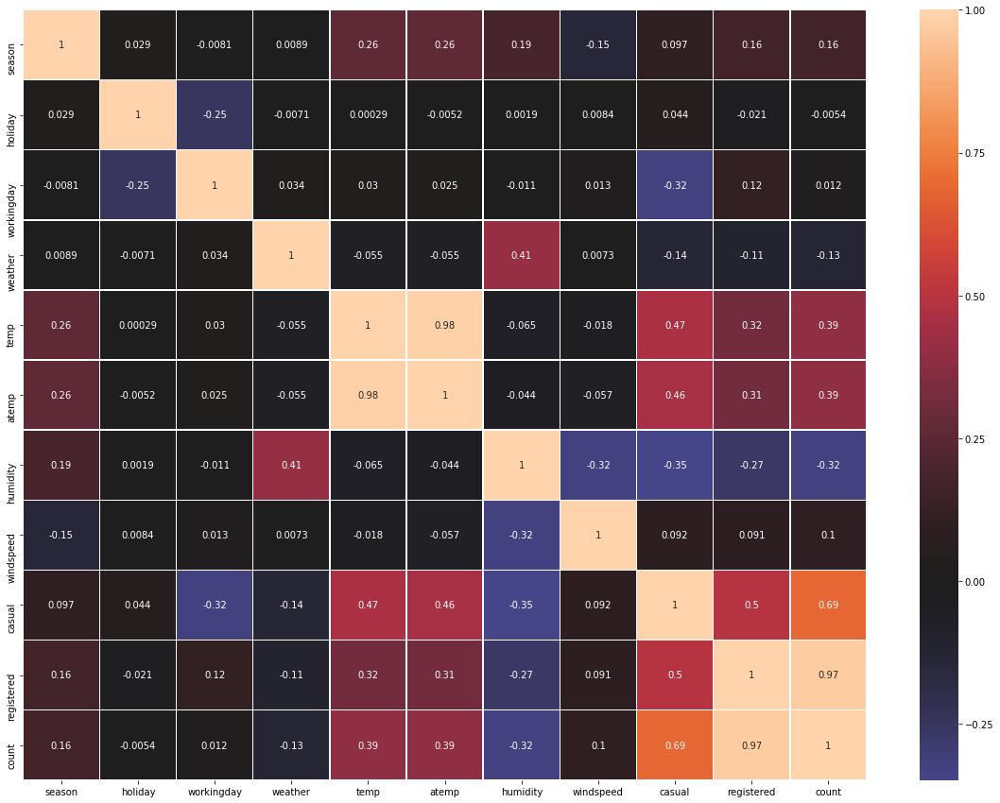

In [14]:
plt.figure(figsize=(20, 15))
sns.heatmap(df.corr(), annot=True, linewidths=0.5, center=0)

### Observations:

1. It is obvious that casual and registered are correlated since count is erived from count
2. Temperature and Feels like Temperature are slighlty correlated with count 
3. We can remove either Temperature or Feels like Temperature as both are interdependent with same correlation
4. Humidity is negatively correlated to bike rentals, which mean as humidity inncreases the rental counts decreases, same goes for Holiday

### Distribution of variables using Count

In [15]:
cols = list(df.columns)

for col in cols :
    if col not in ['datetime']:
        df[col].iplot(kind='hist',xTitle=col,yTitle='Counts')

### Observations:

1. There are less holidays in the training data
2. More working days are present in the dataset with respect to holidays and weekends 
3. The count of 'Heavy Rain' is absent in the data, while the count of 'Clear' weather is the highest 
4. Temperature and Feels like Temperature is Normally Distributed
5. Humidity is skewed towards right, and for 22 entries the humidity is zero 
6. There are arounf 1313 entries with zero value for Windspeed
7. Total Rental counts is skewed towards left with majority data points having zero count

### Lets consider each variables  

### 1. Count

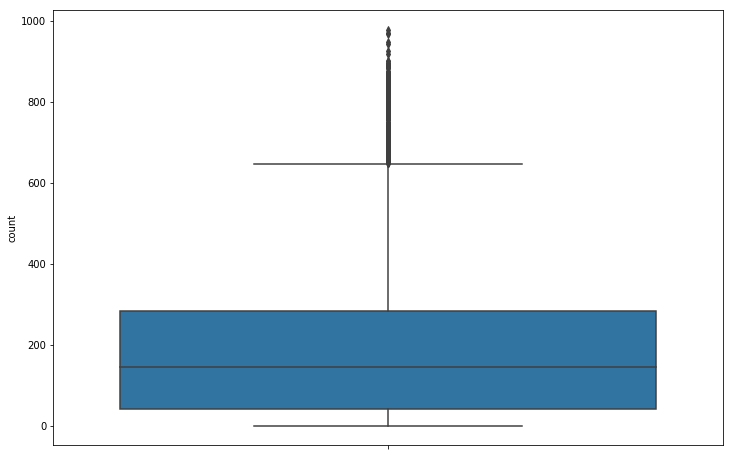

In [16]:
plt.figure(figsize=(12,8))
sns.boxplot(y='count', data=df)

There are some outliers having value more than 600, lets remove those values and check the distribution

(10474, 12)

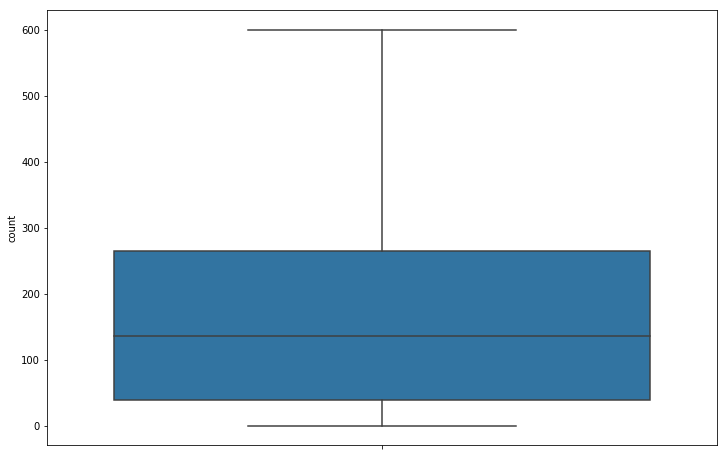

In [17]:
countWithoutOutliers =  df.drop(df.index[np.where(df['count'] > 600)])
plt.figure(figsize=(12,8))
sns.boxplot(y='count', data=countWithoutOutliers)
countWithoutOutliers.shape

The mean has not changed,  and the total  count of the data reduced from 10886 to 10474 which is around 400 datapoints

### Casual and Registered

In [18]:
cols = ['casual','registered']

for col in cols :
    df.groupby('season').max()[col].iplot(
    yTitle='Rental Count',
    xTitle='Season',
    title='Season Wise Maximum '+col+ ' Bikes',
    colors='Red',
    mode='lines+markers')

The maximum counts of Registered Bikers are more in the Fall Season while it is least for the Casual Bikers

In [19]:
df.groupby('season').max()[['registered','casual']].iplot(
    yTitle='Number of Casual VS Registered Bikers',
    xTitle='Season',
    title='Season Wise Casual VS Registered Maximum Bike Rentals',
    mode='lines+markers')

Lets drop Casual and Registerd Bikers and visualize the data as Count is nothing but the summation of both

In [20]:
df.drop(['casual','registered'],axis = 1 ,inplace = True)
df.head().transpose()

,0,1,2,3,4
datetime,2011-01-01 00:00:00,2011-01-01 01:00:00,2011-01-01 02:00:00,2011-01-01 03:00:00,2011-01-01 04:00:00
season,1,1,1,1,1
holiday,0,0,0,0,0
workingday,0,0,0,0,0
weather,1,1,1,1,1
temp,9.84,9.02,9.02,9.84,9.84
atemp,14.395,13.635,13.635,14.395,14.395
humidity,81,80,80,75,75
windspeed,0,0,0,0,0
count,16,40,32,13,1


### Adding new features to explore the hourly data

In [21]:
df['datetime'] = pd.to_datetime(df.datetime)
df['year'] = df['datetime'].dt.year
df['month'] = df['datetime'].dt.month
df['quarter'] = df['datetime'].dt.quarter
df['weekNumberInYear'] = df['datetime'].dt.week
df['dayInWeek'] = df['datetime'].dt.dayofweek.apply(lambda x : cal.day_name[x])
df['hourOfDay'] = df['datetime'].dt.hour
df.head().transpose()

,0,1,2,3,4
datetime,2011-01-01 00:00:00,2011-01-01 01:00:00,2011-01-01 02:00:00,2011-01-01 03:00:00,2011-01-01 04:00:00
season,1,1,1,1,1
holiday,0,0,0,0,0
workingday,0,0,0,0,0
weather,1,1,1,1,1
temp,9.84,9.02,9.02,9.84,9.84
atemp,14.395,13.635,13.635,14.395,14.395
humidity,81,80,80,75,75
windspeed,0,0,0,0,0
count,16,40,32,13,1


### Correlation Matrix after removing Casual and Registered Bikers and adding new variables

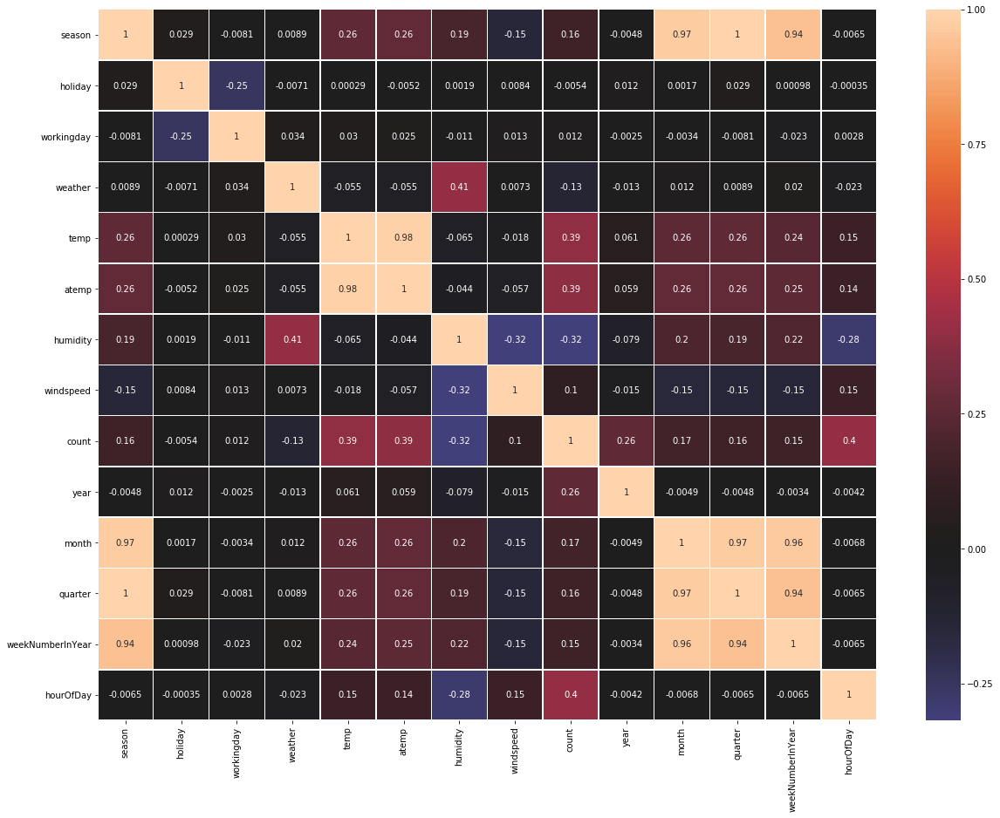

In [22]:
plt.figure(figsize=(20, 15))
sns.heatmap(df.corr(), annot=True, linewidths=0.5, center=0)

### Observations:

1. Hour of the day is moderately correlated to the bike rentals
2. Year, month quarter and week numbers are positively correlated to the bike rentals

### Weekly Bike Rentals with repect to Season

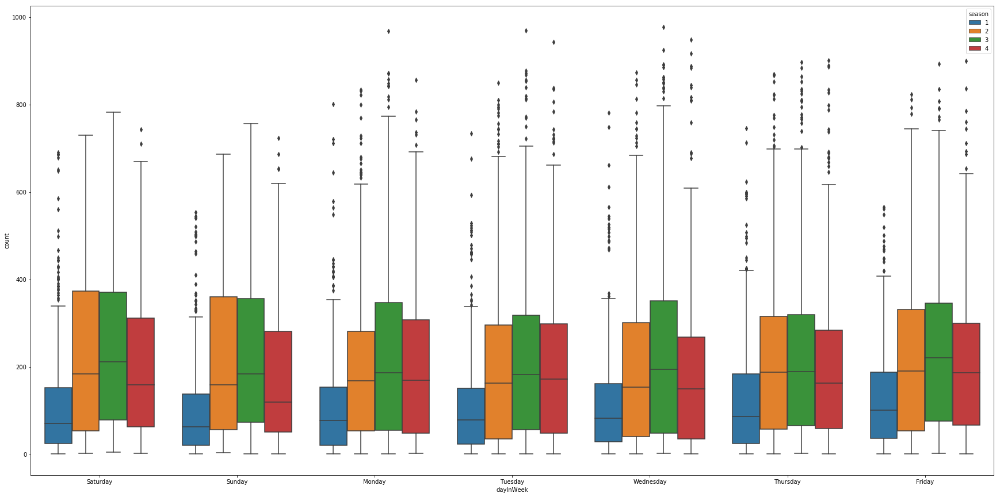

In [23]:
plt.figure(figsize=(30,15))
sns.boxplot('dayInWeek','count', data=df, hue = 'season')

### Observations:

1. It can be inferred that for Summer and Fall Seasons the mean rental  count is always greater,  least for Spring season
2. Fall always been the highest with mean rental count weekly 
3. There are no outliers for Weekends inn the Summer and Fall Season

### Hourly Bike Rentals with repect to Season

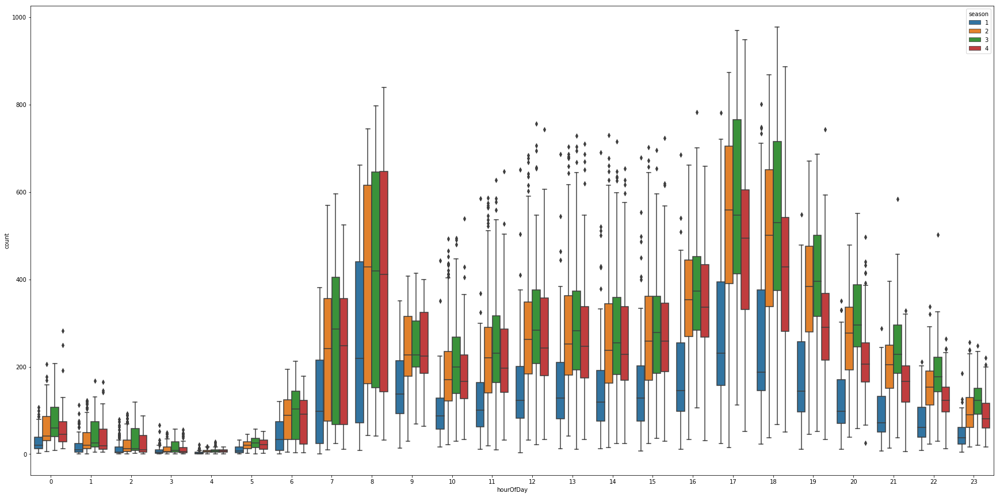

In [24]:
plt.figure(figsize=(30,15))
sns.boxplot('hourOfDay','count', data=df, hue = 'season')

### Observations:

1. For all dour seasons the mean rental count was highest between 7am and 8am & 5pm and 6pm  
2. It can be inferred that most of the bikers are using bikes for travelling during office hours, hence more office going people
3. For Winter again the count was low  

### Relation between hour of the day and count of rentals is slightly linear

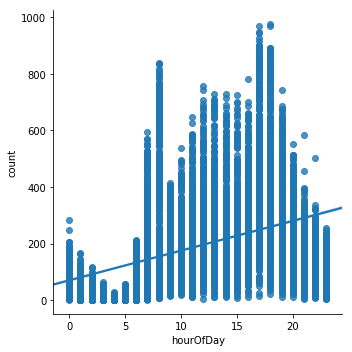

In [25]:
sns.lmplot('hourOfDay','count', data=df)

### Lets map the numeric values of Season to real categorical values 

In [26]:
df["season"] = df.season.map({1: "Spring", 2 : "Summer", 3 : "Fall", 4 :"Winter" })

### Bike Rental Distribution with repect to Year

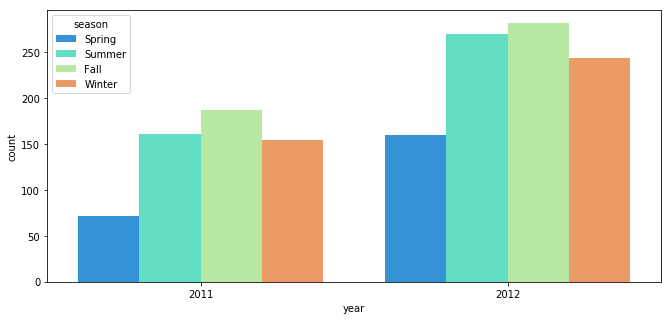

In [27]:
plt.figure(figsize=(11,5))
sns.barplot('year','count',hue='season', data=df,palette='rainbow', ci=None)

The total Rental count increases with the year

### Bike Rental Distribution with repect to Season, Month, Week and Hour

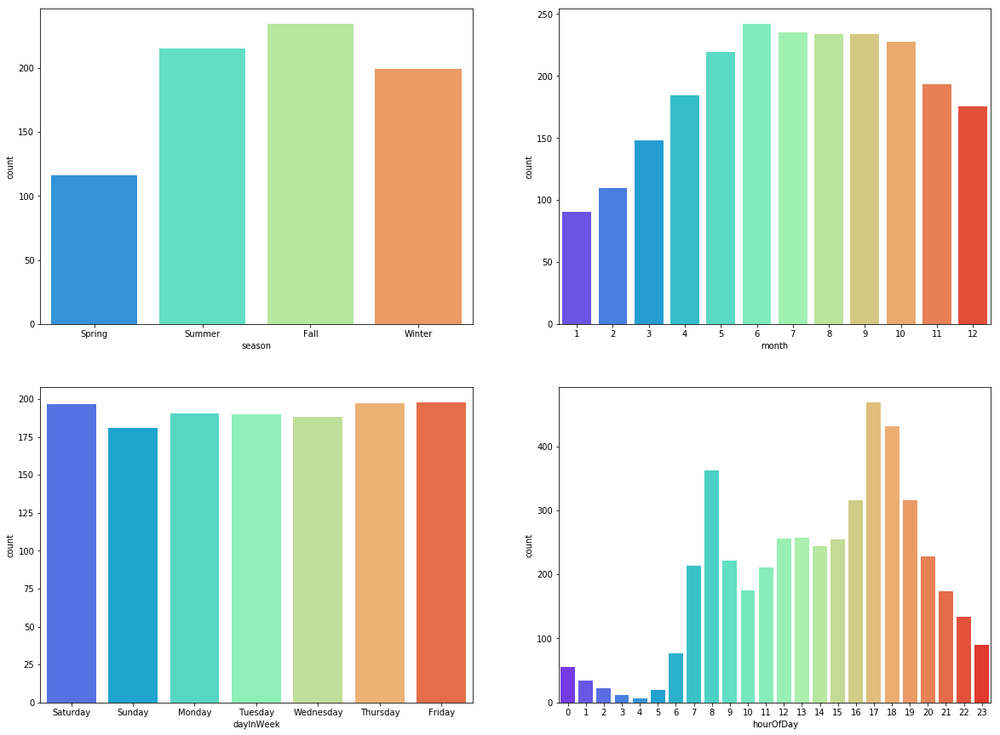

In [28]:
fig,axes = plt.subplots(ncols=2,nrows=2)
fig.set_size_inches(20, 15)
sns.barplot('season', 'count',data=df,palette='rainbow', ci=None,ax=axes[0][0])
sns.barplot('month', 'count',data=df,palette='rainbow', ci=None, ax=axes[0][1])
sns.barplot('dayInWeek', 'count',data=df,palette='rainbow', ci=None,ax=axes[1][0] )
sns.barplot('hourOfDay', 'count',data=df,palette='rainbow', ci=None,ax=axes[1][1] )

### Observations:

1. Average Rental Count is least for Sundays  
2. Between 5pm and 6pm the average count is the highest   
3. Summer and Fall has the highest count

### Bike Rental Maximum count with repect to Season, Month, Week and Hour

In [29]:
df.groupby('season').max()['count'].iplot(
    yTitle='Bike Rentals',
    xTitle='Season',
    title='Season Wise Maximum Bike Rentals',
    colors='Red',
    mode='lines+markers')

df.groupby('month').max()['count'].iplot(
    yTitle='Bike Rentals',
    xTitle='Month',
    title='Month Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

df.groupby('dayInWeek').max()['count'].iplot(
    yTitle='Bike Rentals',
    xTitle='Week',
    title='Week Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

df.groupby('hourOfDay').max()['count'].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

### Observations: 

1. 977 was the highest count for Fall in the month of September and 801 for Spring which is the least 
2. Monday Tuesday Wednesday marked the highest count  

### Trend Analysis

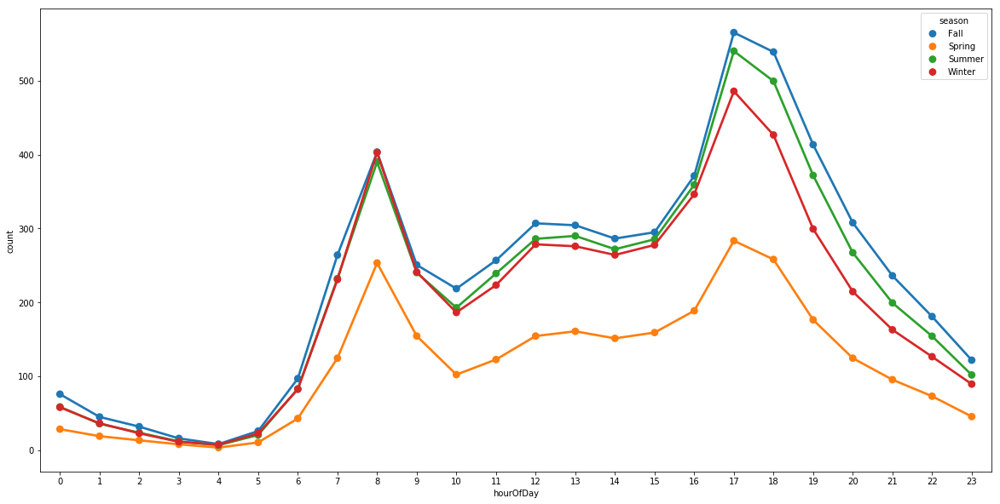

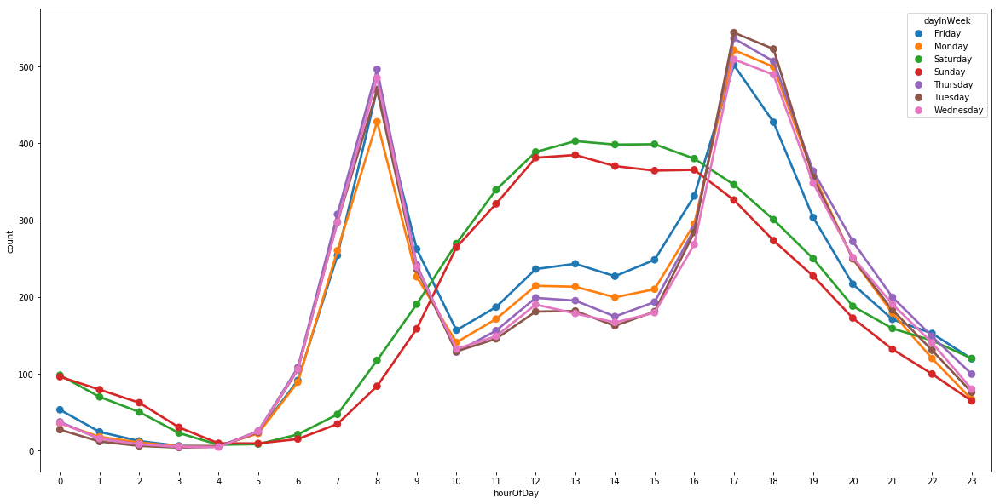

In [30]:
plt.figure(figsize=(20,10))
seasonWise = pd.DataFrame(df.groupby(["hourOfDay","season"],sort=True)["count"].mean()).reset_index()
sns.pointplot(x=seasonWise["hourOfDay"], y=seasonWise["count"],hue=seasonWise["season"],
             data=seasonWise, join=True)

plt.figure(figsize=(20,10))
weekWise = pd.DataFrame(df.groupby(["hourOfDay","dayInWeek"],sort=True)["count"].mean()).reset_index()
sns.pointplot(x=weekWise["hourOfDay"], y=weekWise["count"],hue=weekWise["dayInWeek"],
             data=weekWise, join=True)

### Observations:

1. The mean count for Fall has been highest while Spring been the least
2. A new obeservation is that even though the mean is low for the weekdays from 9am to 4pm, it is higher for Weekends  

### Temperature

In [31]:
df.groupby('hourOfDay').min()[['temp','count']].iplot(
    yTitle='Mimimum Bike Rentals Count VS Temperature',
    xTitle='Hour',
    title='Hour Wise Bike Rentals Count VS Temperature',
    mode='lines+markers')

Hourly trend has been the same even though the temperature changes

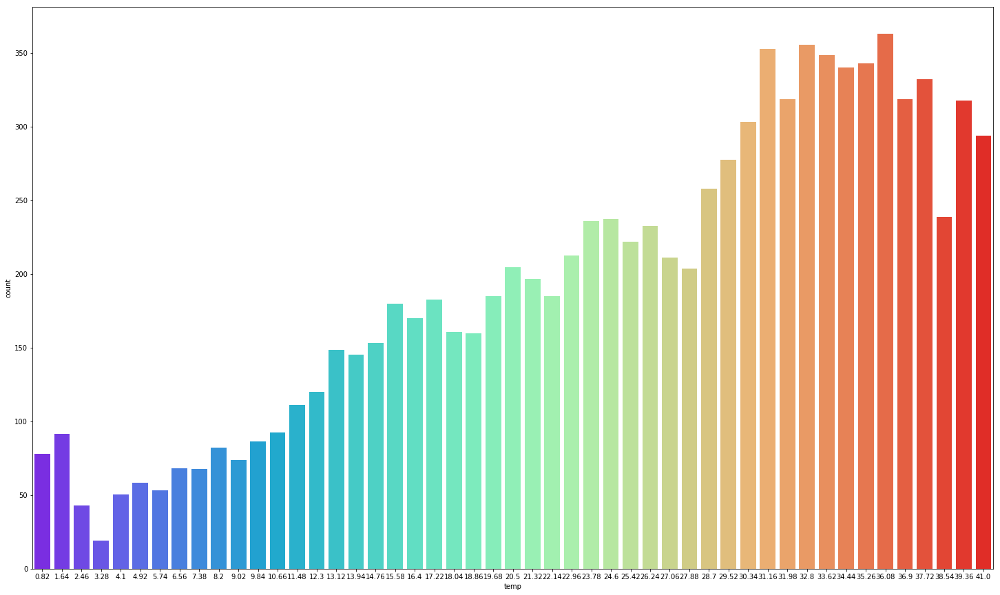

In [32]:
plt.figure(figsize=(25,15))
sns.barplot('temp', 'count',data=df,palette='rainbow', ci=None)

As the temperature increase the mean bike rental count increase

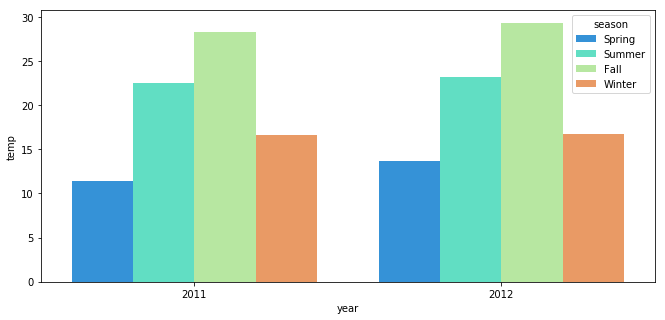

In [33]:
plt.figure(figsize=(11,5))
sns.barplot('year','temp',hue='season', data=df,palette='rainbow', ci=None)

Temperature has been the almost the same for both the years 

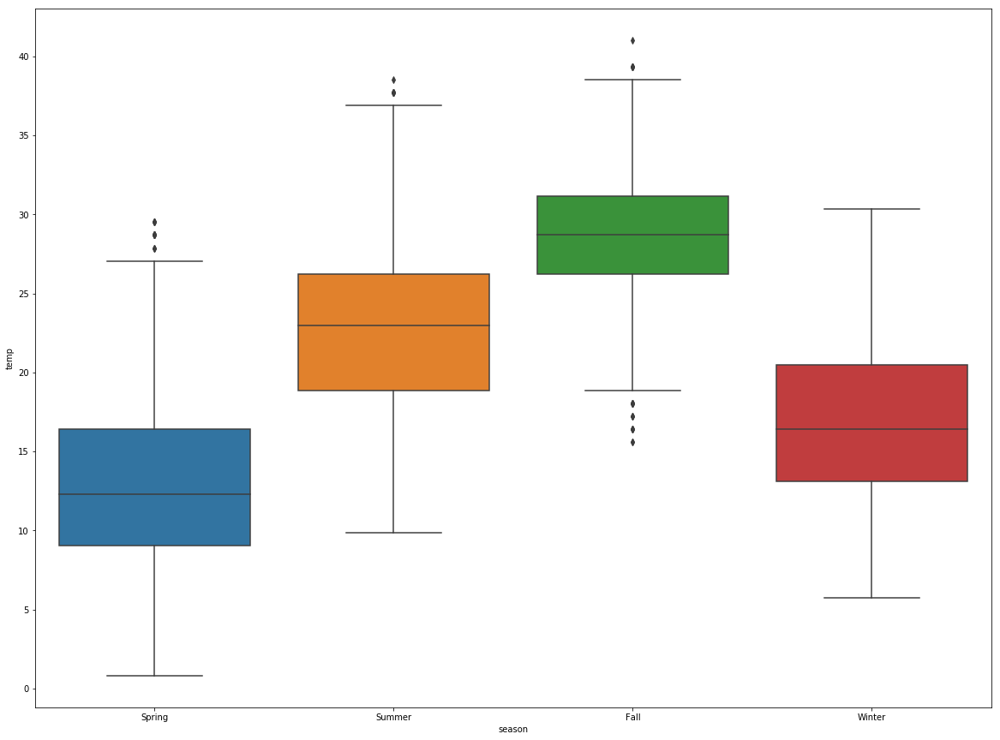

In [34]:
plt.figure(figsize=(20,15))
sns.boxplot('season','temp', data=df)

Even though the temperature is the highest for Fall, there are outliers with low temperature

### Temperature Distribution with repect to Season, Month, Week and Hour

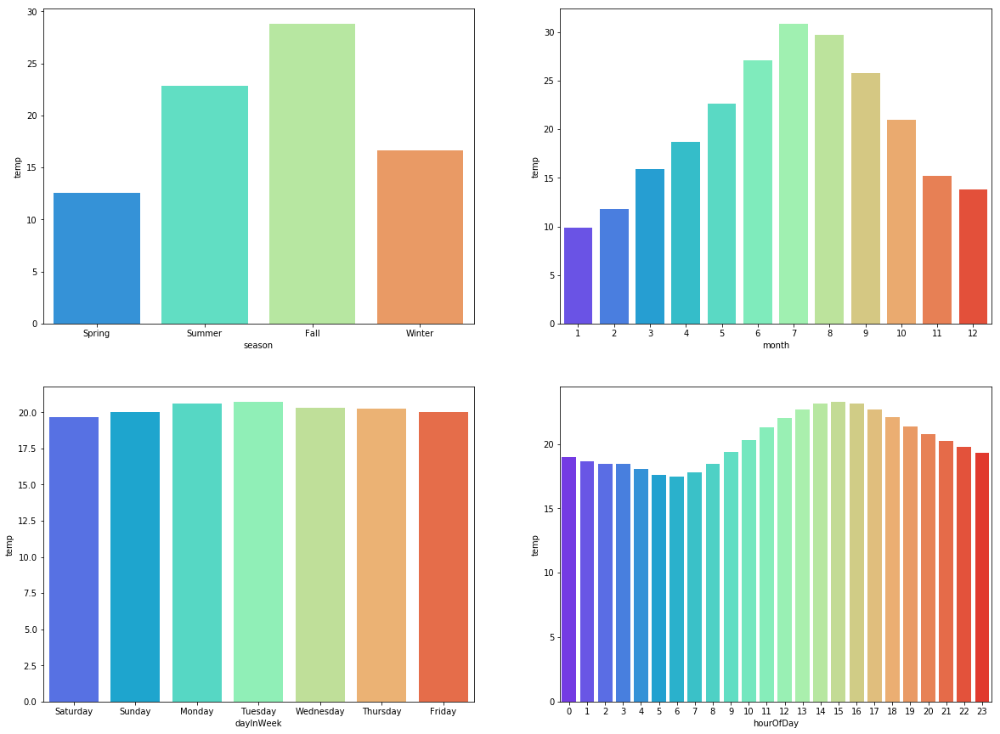

In [35]:
fig,axes = plt.subplots(ncols=2,nrows=2)
fig.set_size_inches(20, 15)
sns.barplot('season', 'temp',data=df,palette='rainbow', ci=None,ax=axes[0][0])
sns.barplot('month', 'temp',data=df,palette='rainbow', ci=None, ax=axes[0][1])
sns.barplot('dayInWeek', 'temp',data=df,palette='rainbow', ci=None,ax=axes[1][0])
sns.barplot('hourOfDay', 'temp',data=df,palette='rainbow', ci=None,ax=axes[1][1])

### Observations:

1. Monthly the temperature data is normally distributed  
2. Hourly the temperature increases from 7am and decreases after 4pm    

### Maximum temperature with repect to Season, Month, Week and Hour

In [36]:
df.groupby('season').mean()['temp'].iplot(
    yTitle='Bike Rentals',
    xTitle='Season',
    title='Season Wise Maximum Bike Rentals',
    colors='Red',
    mode='lines+markers')

df.groupby('month').mean()['temp'].iplot(
    yTitle='Bike Rentals',
    xTitle='Month',
    title='Month Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

df.groupby('dayInWeek').mean()['temp'].iplot(
    yTitle='Bike Rentals',
    xTitle='Week',
    title='Week Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

df.groupby('hourOfDay').mean()['temp'].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

### Observations:

1. 28 was the highest mean vaue of temperature for Fall and 30 for the month of July 
2. Monday and Tuesday marked the highest count

### Comparing  Temperature with Feels Like Temperature

In [37]:
df.groupby('season').mean()[['temp','atemp']].iplot(
    yTitle='Bike Rentals',
    xTitle='Season',
    title='Season Wise Maximum Bike Rentals',
    mode='lines+markers')

df.groupby('month').mean()[['temp','atemp']].iplot(
    yTitle='Bike Rentals',
    xTitle='Month',
    title='Month Wise Maximum Bike Rental',
    mode='lines+markers')

df.groupby('hourOfDay').mean()[['temp','atemp']].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    mode='lines+markers')

Both behaves in similar manner with a mean difference of 3

### Lets categorize the weather data 

In [38]:
df["weather"] = df.weather.map({1: "Clear",\
                                        2 : "Mist", \
                                        3 : "Light Snow", \
                                        4 : "Heavy Rain" })

### Weather

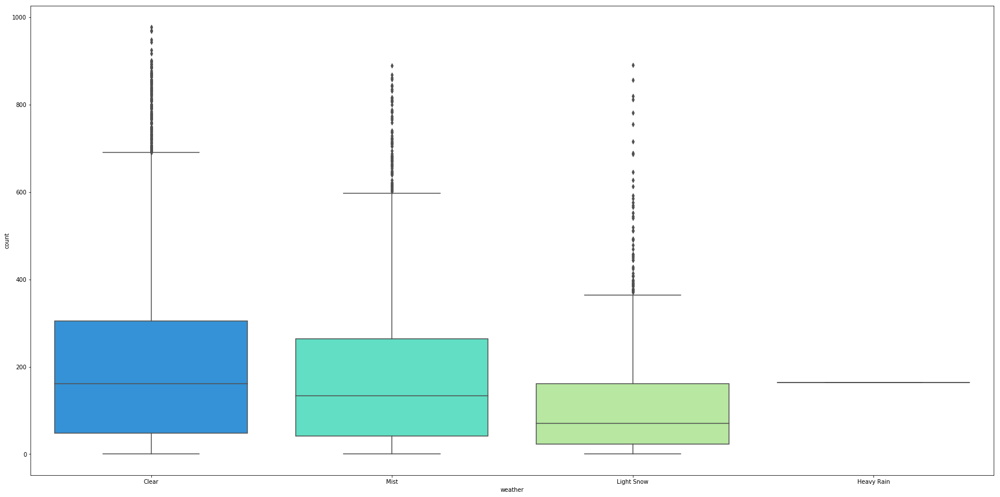

In [39]:
plt.figure(figsize=(30,15))
sns.boxplot('weather', 'count',data=df,palette='rainbow')

There is an observation with Heavy Rain as a Weather

In [40]:
df[df['weather'] == 'Heavy Rain']

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,count,year,month,quarter,weekNumberInYear,dayInWeek,hourOfDay
5631,2012-01-09 18:00:00,Spring,0,1,Heavy Rain,8.2,11.365,86,6.0032,164,2012,1,1,2,Monday,18


In [41]:
df_test[df_test['weather'] == 4]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed
154,2011-01-26 16:00:00,1,0,1,4,9.02,9.85,93,22.0028
3248,2012-01-21 01:00:00,1,0,0,4,5.74,6.82,86,12.9980


There is only one datapoint with Heavy Rain in the entire Training Dataset and two in the testing data  

### Windspeed

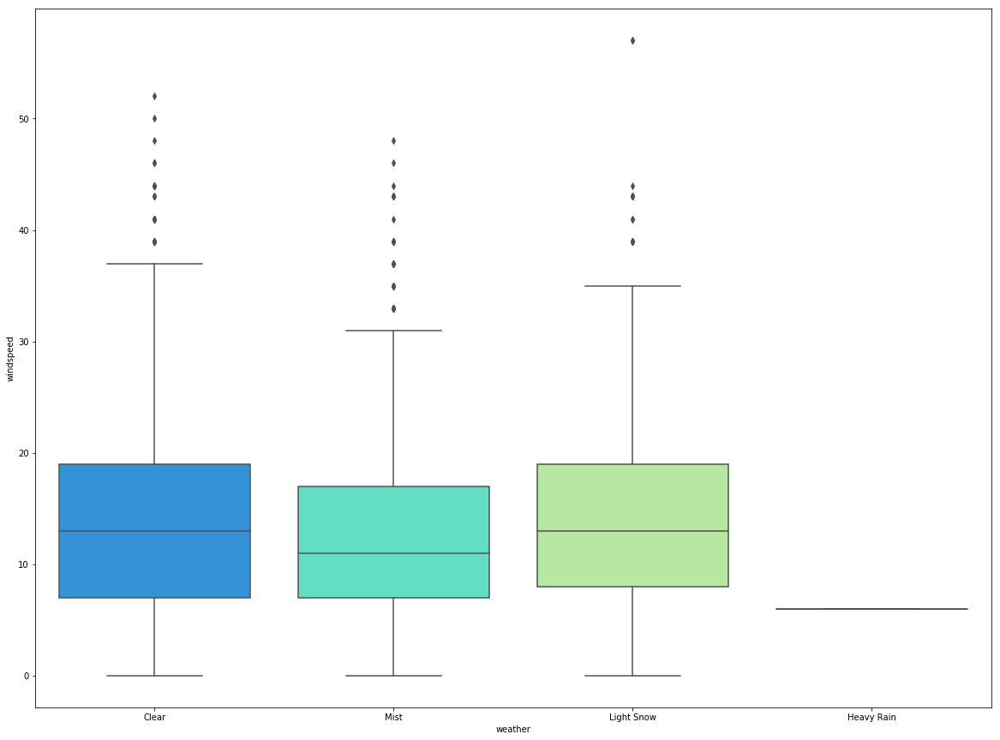

In [42]:
plt.figure(figsize=(20,15))
sns.boxplot( 'weather','windspeed',data=df,palette='rainbow')

### Observations:

1. The mean windspeed was lowest for the Mist Weather  
2. An outlier can be seen which is above 50 

In [43]:
df[df['windspeed'] > 50]

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,count,year,month,quarter,weekNumberInYear,dayInWeek,hourOfDay
760,2011-02-15 01:00:00,Spring,0,1,Clear,12.30,12.12,42,51.9987,5,2011,2,1,7,Tuesday,1
868,2011-02-19 15:00:00,Spring,0,0,Clear,18.04,21.97,16,50.0021,171,2011,2,1,7,Saturday,15
2755,2011-07-03 17:00:00,Fall,0,0,Light Snow,32.80,37.12,49,56.9969,358,2011,7,3,26,Sunday,17
2756,2011-07-03 18:00:00,Fall,0,0,Light Snow,32.80,37.12,49,56.9969,181,2011,7,3,26,Sunday,18


Only 4 datapoints are present in the training dataset

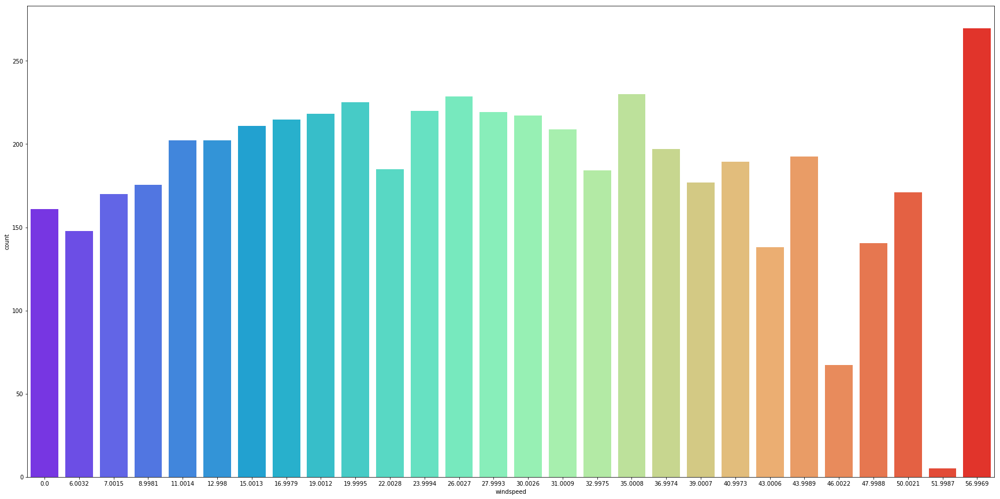

In [44]:
plt.figure(figsize=(30,15))
sns.barplot('windspeed', 'count',data=df,palette='rainbow', ci=None)

Even though the windspeed was highest bikes were been rented

### Windspeed with repect to Season, Month and Hour

In [45]:
df.groupby('season').mean()['windspeed'].iplot(
    yTitle='Bike Rentals',
    xTitle='Season',
    title='Season Wise Maximum Bike Rentals',
    colors='Red',
    mode='lines+markers')

df.groupby('month').mean()['windspeed'].iplot(
    yTitle='Bike Rentals',
    xTitle='Month',
    title='Month Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

df.groupby('hourOfDay').mean()['windspeed'].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    colors='Red',
    mode='lines+markers')

The mean windspeed inncreased with hour but decreased with month  

### Relation of Windspeed  and Humidity

In [46]:
df.groupby('hourOfDay').mean()[['windspeed','humidity']].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    mode='lines+markers')

Humidity and windspeed are negatively correlated

### Season wise distribution of Bike Rentals, Temperature, Humidity and Windspeed

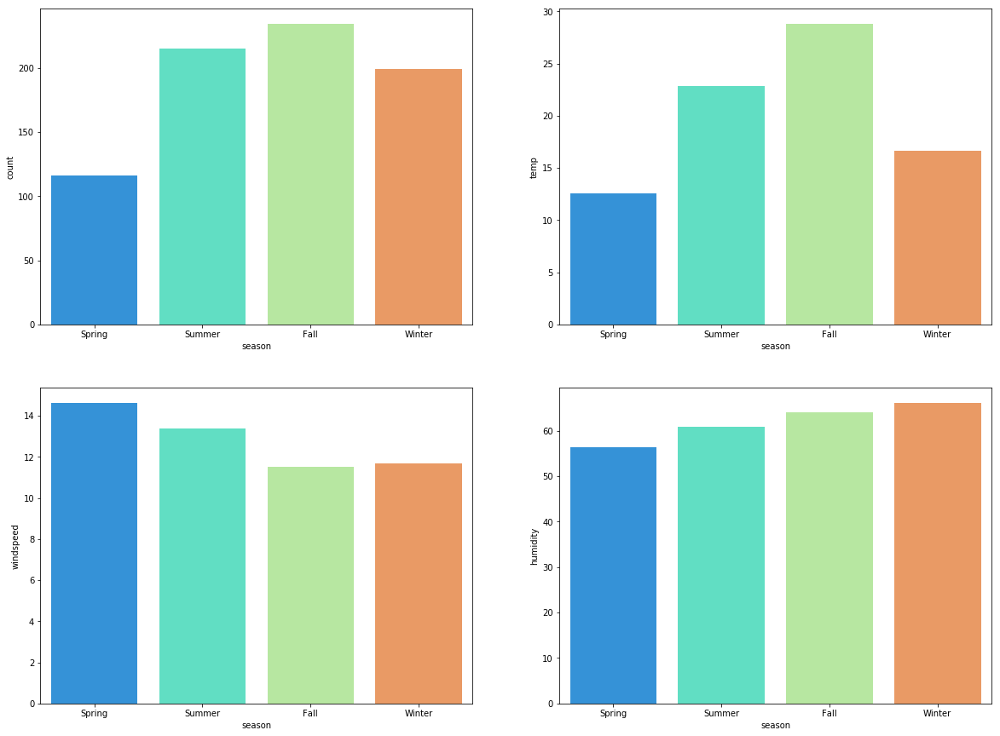

In [47]:
fig,axes = plt.subplots(ncols=2,nrows=2)
fig.set_size_inches(20, 15)
sns.barplot('season', 'count',data=df,palette='rainbow', ci=None,ax=axes[0][0])
sns.barplot('season', 'temp',data=df,palette='rainbow', ci=None, ax=axes[0][1])
sns.barplot('season', 'windspeed',data=df,palette='rainbow', ci=None,ax=axes[1][0])
sns.barplot('season', 'humidity',data=df,palette='rainbow', ci=None,ax=axes[1][1])

Windspeed is negatively correlated with the count, temperature and Humidity season wise

### Hourly distribution of Bike Rentals, Temperature, Humidity and Windspeed

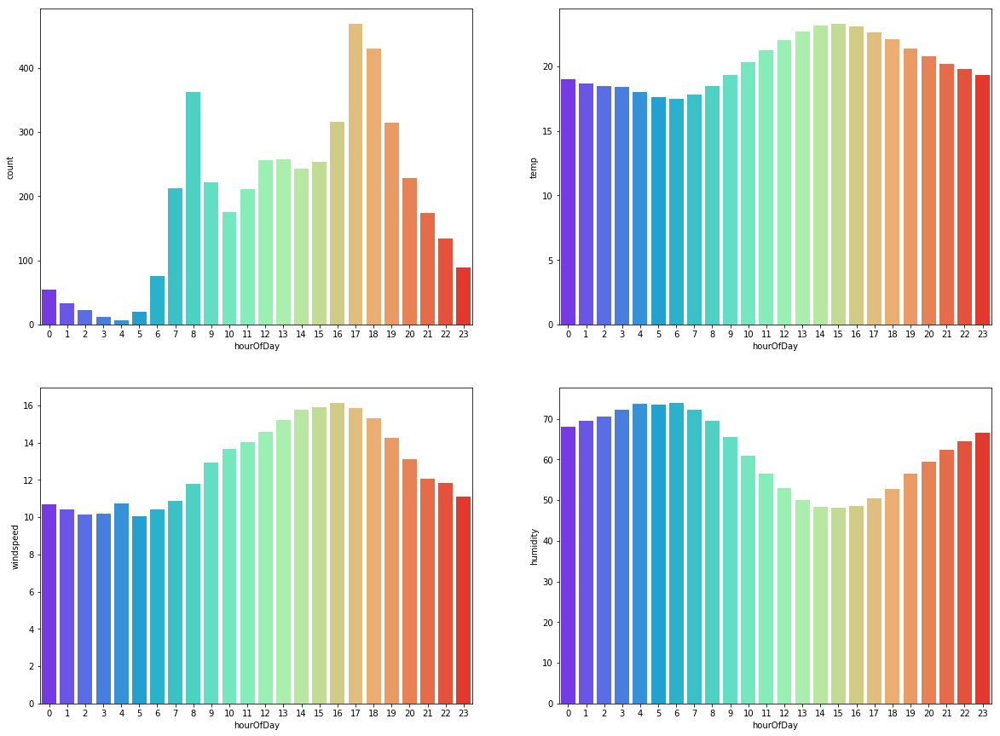

In [48]:
fig,axes = plt.subplots(ncols=2,nrows=2)
fig.set_size_inches(20, 15)
sns.barplot('hourOfDay', 'count',data=df,palette='rainbow', ci=None,ax=axes[0][0])
sns.barplot('hourOfDay', 'temp',data=df,palette='rainbow', ci=None, ax=axes[0][1])
sns.barplot('hourOfDay', 'windspeed',data=df,palette='rainbow', ci=None,ax=axes[1][0])
sns.barplot('hourOfDay', 'humidity',data=df,palette='rainbow', ci=None,ax=axes[1][1])

Bike rental does not have major impact for the period 8am and 5pm to 6pm

In [49]:
df.groupby('hourOfDay').mean()[['windspeed','humidity','temp','count']].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    mode='lines+markers')

### Observations:

1. Bike rental does not have major impact for the period 8am and 5pm to 6pm  
2. 466 was the mean count for an average temperature of 22 degree Clecius, 50 humidity , and 15 windseed at 5pm 

In [50]:
df.groupby('weekNumberInYear').mean()[['windspeed','humidity','temp','count']].iplot(
    yTitle='Bike Rentals',
    xTitle='Hour',
    title='Hour Wise Maximum Bike Rental',
    mode='lines+markers')

There is a sudden decrease for count in the 52nd week may be because of Christmas vacation

### Holiday and Working Day Analysis

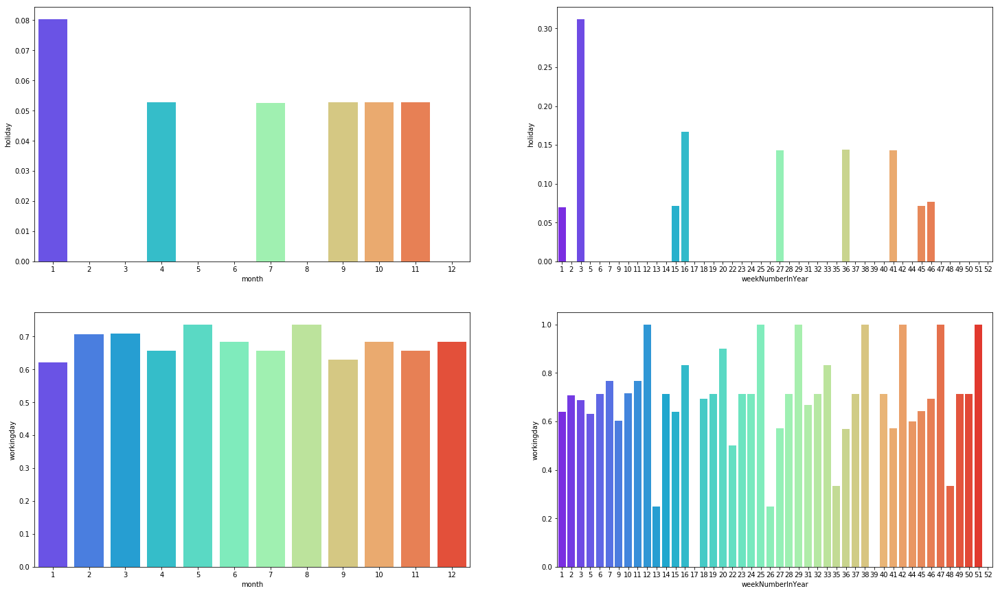

In [51]:
fig,axes = plt.subplots(ncols=2,nrows=2)
fig.set_size_inches(25,15)
sns.barplot('month','holiday',data=df,palette='rainbow', ci=None,ax=axes[0][0])
sns.barplot('weekNumberInYear', 'holiday',data=df,palette='rainbow', ci=None, ax=axes[0][1])
sns.barplot('month', 'workingday',data=df,palette='rainbow', ci=None,ax=axes[1][0])
sns.barplot('weekNumberInYear', 'workingday',data=df,palette='rainbow', ci=None,ax=axes[1][1])

### Observations:

1. Since the trainig data set contains data till 20th, it is improper to take out any inferences  
2. Although the working day is evenly distributed 